### 2. Azure Document Intelligence 기반 역사문서 OCR 분석 및 PIL 시각화
- 주요 역할: Azure Document Intelligence OCR 결과를 분석하여 세로줄별로 그룹화하고 시각화
- 핵심 라이브러리: PIL(Pillow), Azure Document Intelligence, matplotlib
- 특징: 한글 경로 지원, 세로줄 기반 텍스트 분석, 신뢰도 통계 제공

In [1]:
pip install opencv-python pillow matplotlib numpy

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
pip install azure-ai-documentintelligence

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


✅ .env 파일 로드 완료
✅ Azure SDK 로드 완료
🚀 Enhanced Azure Document Intelligence OCR
🚀 Enhanced Azure OCR 분석기 초기화...
✅ Azure 클라이언트 연결 성공
✅ 초기화 완료
🚀 Azure 완전 분석 시작: 태조실록_001권_총서_001a면.jpg
📄 Azure로 실시간 분석 중: 태조실록_001권_총서_001a면.jpg
⏳ Azure API 호출 중... (30초-2분 소요)
✅ Azure 실시간 분석 완료: 342개 단어, 평균 신뢰도 0.912
🎨 강화된 시각화 생성: 태조실록_001권_총서_001a면.jpg
💾 강화된 시각화 저장: 태조실록_001권_총서_001a면_enhanced_viz_20250805_133450.png


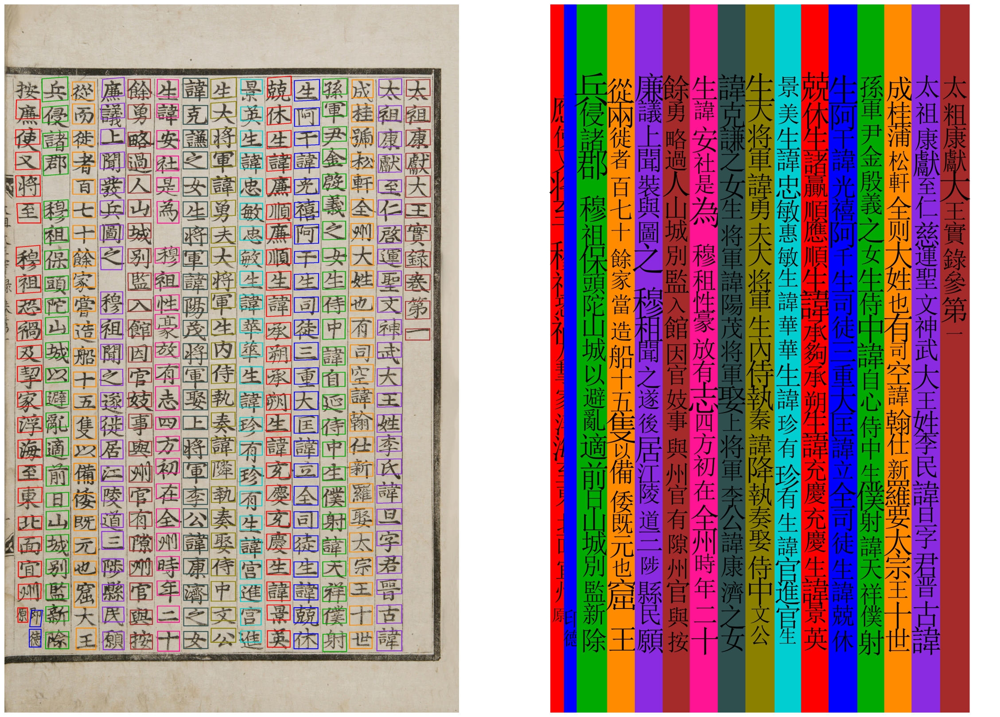

📊 분석 결과: 342개 단어, 16개 세로줄
✅ 강화된 분석 및 시각화 완료!
🎉 강화된 분석 성공!


In [9]:
"""
Azure Document Intelligence 역사문서 OCR 분석 도구 (개선 버전)
- 실시간 Azure API 호출 및 OCR 분석
- 한자/고문서 시각화 강화
- 세로줄 기반 컬러 렌더링
"""

# Jupyter 환경 설정
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [24, 16]

import os
import json
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from typing import List, Dict, Optional
import platform
import warnings
from pathlib import Path
from datetime import datetime

# 환경변수 로드
try:
    from dotenv import load_dotenv
    load_dotenv()
    print("✅ .env 파일 로드 완료")
except ImportError:
    print("⚠️ python-dotenv 설치 필요: pip install python-dotenv")

# Azure SDK imports
try:
    from azure.core.credentials import AzureKeyCredential
    from azure.ai.documentintelligence import DocumentIntelligenceClient
    from azure.ai.documentintelligence.models import AnalyzeDocumentRequest
    AZURE_SDK_AVAILABLE = True
    print("✅ Azure SDK 로드 완료")
except ImportError:
    AZURE_SDK_AVAILABLE = False
    print("❌ Azure SDK 없음. 설치 필요: pip install azure-ai-documentintelligence")

warnings.filterwarnings('ignore')


class EnhancedAzureOCRAnalyzer:
    """개선된 Azure Document Intelligence OCR 분석기"""
    
    def __init__(self):
        print("🚀 Enhanced Azure OCR 분석기 초기화...")
        
        # 더 진한 색상 정의 (구분하기 쉽게)
        self.colors = [
            '#FF0000',  # 빨강
            '#0000FF',  # 파랑  
            '#00AA00',  # 녹색
            '#FF8C00',  # 주황
            '#8A2BE2',  # 보라
            '#A52A2A',  # 갈색
            '#FF1493',  # 핑크
            '#2F4F4F',  # 회색
            '#8B8000',  # 올리브
            '#00CED1'   # 청록
        ]
        
        # RGB 색상 맵 (PIL용)
        self.color_map = {
            '#FF0000': (255, 0, 0),
            '#0000FF': (0, 0, 255), 
            '#00AA00': (0, 170, 0),
            '#FF8C00': (255, 140, 0),
            '#8A2BE2': (138, 43, 226),
            '#A52A2A': (165, 42, 42),
            '#FF1493': (255, 20, 147),
            '#2F4F4F': (47, 79, 79),
            '#8B8000': (139, 128, 0),
            '#00CED1': (0, 206, 209)
        }
        
        # Azure 클라이언트 설정
        self.document_client = self._setup_azure_client()
        
        # 폰트 설정
        self.han_font = self._setup_cjk_font()
        self._configure_matplotlib()
        
        print(f"✅ 초기화 완료")
    
    def _setup_azure_client(self):
        """Azure 클라이언트 설정"""
        if not AZURE_SDK_AVAILABLE:
            print("❌ Azure SDK 설치 필요: pip install azure-ai-documentintelligence")
            return None
        
        # 환경변수에서 로드
        endpoint = os.getenv('AZURE_INTELLIGENCE_ENDPOINT')
        key = os.getenv('AZURE_INTELLIGENCE_KEY')
        
        if not endpoint or not key:
            print("❌ Azure 환경변수가 설정되지 않았습니다.")
            return None
        
        try:
            client = DocumentIntelligenceClient(
                endpoint=endpoint,
                credential=AzureKeyCredential(key)
            )
            print("✅ Azure 클라이언트 연결 성공")
            return client
        except Exception as e:
            print(f"❌ Azure 클라이언트 연결 실패: {e}")
            return None
    
    def _setup_cjk_font(self):
        """한자 폰트 설정 (더 큰 크기)"""
        system = platform.system()
        
        if system == "Windows":
            font_paths = [
                "C:/Windows/Fonts/simsun.ttc",  # 한자 최적화
                "C:/Windows/Fonts/msyh.ttc",
                "C:/Windows/Fonts/batang.ttc"
            ]
            
            for font_path in font_paths:
                if os.path.exists(font_path):
                    try:
                        return fm.FontProperties(fname=font_path)
                    except:
                        continue
        
        return fm.FontProperties()
    
    def _configure_matplotlib(self):
        """matplotlib 설정"""
        plt.rcParams['font.family'] = ['sans-serif']
        plt.rcParams['axes.unicode_minus'] = False
        plt.rcParams['font.size'] = 14
    
    def analyze_image_realtime(self, image_path: str) -> Optional[Dict]:
        """실시간 Azure API로 이미지 분석"""
        if not self.document_client:
            print("❌ Azure 클라이언트가 설정되지 않았습니다.")
            return None
        
        if not os.path.exists(image_path):
            print(f"❌ 이미지 파일이 없습니다: {image_path}")
            return None
        
        try:
            print(f"📄 Azure로 실시간 분석 중: {os.path.basename(image_path)}")
            print("⏳ Azure API 호출 중... (30초-2분 소요)")
            
            # 이미지 파일 읽기
            with open(image_path, 'rb') as f:
                image_data = f.read()
            
            # Azure Document Intelligence API 실시간 호출
            poller = self.document_client.begin_analyze_document(
                "prebuilt-read",
                AnalyzeDocumentRequest(bytes_source=image_data)
            )
            
            # 결과 대기
            result = poller.result()
            
            # 결과를 표준 형태로 변환
            ocr_result = {
                "analyzeResult": {
                    "pages": [],
                    "version": "4.0",
                    "apiVersion": "2024-02-29-preview",
                    "modelId": "prebuilt-read"
                }
            }
            
            total_words = 0
            total_confidence = 0
            
            for page_idx, page in enumerate(result.pages):
                page_data = {
                    "pageNumber": page_idx + 1,
                    "words": []
                }
                
                if hasattr(page, 'words') and page.words:
                    for word in page.words:
                        word_data = {
                            "content": word.content,
                            "confidence": word.confidence if hasattr(word, 'confidence') else 0.9,
                            "polygon": list(word.polygon) if hasattr(word, 'polygon') else []
                        }
                        page_data["words"].append(word_data)
                        total_words += 1
                        total_confidence += word_data["confidence"]
                
                ocr_result["analyzeResult"]["pages"].append(page_data)
            
            # 분석 통계
            avg_confidence = total_confidence / total_words if total_words > 0 else 0
            print(f"✅ Azure 실시간 분석 완료: {total_words}개 단어, 평균 신뢰도 {avg_confidence:.3f}")
            
            return ocr_result
            
        except Exception as e:
            print(f"❌ Azure 실시간 분석 실패: {e}")
            return None
    
    def group_words_by_vertical_lines(self, words_data: List[Dict], threshold: float = 50) -> List[List[Dict]]:
        """세로줄로 그룹화 (한자 문서 특성 반영)"""
        if not words_data:
            return []
        
        # X 좌표 기준으로 정렬
        sorted_words = sorted(words_data, key=lambda w: w['polygon'][0])
        vertical_lines = []
        current_line = [sorted_words[0]]
        
        for word in sorted_words[1:]:
            current_line_avg_x = sum(w['polygon'][0] for w in current_line) / len(current_line)
            current_word_x = word['polygon'][0]
            
            if abs(current_word_x - current_line_avg_x) <= threshold:
                current_line.append(word)
            else:
                # Y 좌표로 정렬 (세로 읽기)
                current_line.sort(key=lambda w: w['polygon'][1])
                vertical_lines.append(current_line)
                current_line = [word]
        
        if current_line:
            current_line.sort(key=lambda w: w['polygon'][1])
            vertical_lines.append(current_line)
        
        return vertical_lines
    
    def create_enhanced_visualization(self, image_path: str, ocr_data: Dict, save_path: Optional[str] = None):
        """강화된 OCR 결과 시각화"""
        print(f"🎨 강화된 시각화 생성: {os.path.basename(image_path)}")
        
        # 단어 데이터 추출
        words_data = []
        for page in ocr_data["analyzeResult"]["pages"]:
            words_data.extend(page["words"])
        
        if not words_data:
            print("❌ OCR 데이터가 비어있습니다.")
            return None
        
        # 세로줄 그룹화
        vertical_lines = self.group_words_by_vertical_lines(words_data)
        
        # 원본 이미지 로드
        try:
            original_image = Image.open(image_path)
            width, height = original_image.size
        except Exception as e:
            print(f"❌ 이미지 로드 실패: {e}")
            return None
        
        # 시각화 생성 (제목 없이, 깔끔하게)
        fig, axes = plt.subplots(1, 2, figsize=(24, 16))
        
        # 좌측: 진한 색상 박스 이미지
        boxed_image = self._create_enhanced_colored_boxes(image_path, vertical_lines)
        axes[0].imshow(boxed_image)
        axes[0].axis('off')  # 축 제거
        
        # 우측: 큰 한자 텍스트 + 세로 컬러 라인
        text_image = self._create_enhanced_text_rendering(image_path, vertical_lines, width, height)
        axes[1].imshow(text_image)
        axes[1].axis('off')  # 축 제거
        
        # 여백 최소화
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.02)
        
        # 저장 또는 표시
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
            print(f"💾 강화된 시각화 저장: {save_path}")
        
        plt.show()
        
        # 간단한 통계만 출력
        print(f"📊 분석 결과: {len(words_data)}개 단어, {len(vertical_lines)}개 세로줄")
        
        return vertical_lines
    
    def _create_enhanced_colored_boxes(self, image_path: str, vertical_lines: List[List[Dict]]) -> np.ndarray:
        """진한 색상 박스 이미지 생성"""
        try:
            pil_image = Image.open(image_path).convert('RGB')
            draw = ImageDraw.Draw(pil_image)
            
            for line_idx, line_words in enumerate(vertical_lines):
                color_hex = self.colors[line_idx % len(self.colors)]
                color_rgb = self.color_map[color_hex]
                
                for word in line_words:
                    polygon = word['polygon']
                    if len(polygon) >= 4:
                        points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                        # 더 두꺼운 테두리로 진하게
                        draw.polygon(points, outline=color_rgb, width=5)
            
            return np.array(pil_image)
            
        except Exception as e:
            print(f"❌ 색상 박스 생성 실패: {e}")
            return np.ones((300, 300, 3), dtype=np.uint8) * 255
    
    def _create_enhanced_text_rendering(self, image_path: str, vertical_lines: List[List[Dict]], width: int, height: int) -> np.ndarray:
        """큰 한자 + 세로 컬러 라인 렌더링"""
        try:
            # 흰색 배경 이미지 생성
            pil_image = Image.new('RGB', (width, height), 'white')
            draw = ImageDraw.Draw(pil_image)
            
            # 각 세로줄에 대해 배경 컬러 라인 그리기 + 큰 텍스트
            for line_idx, line_words in enumerate(vertical_lines):
                if not line_words:
                    continue
                    
                color_hex = self.colors[line_idx % len(self.colors)]
                color_rgb = self.color_map[color_hex]
                
                # 세로줄 영역 계산
                x_coords = []
                for word in line_words:
                    polygon = word['polygon']
                    if len(polygon) >= 4:
                        points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                        x_coords.extend([p[0] for p in points])
                
                if x_coords:
                    min_x = min(x_coords) - 10
                    max_x = max(x_coords) + 10
                    
                    # 세로 컬러 스트라이프 배경 그리기
                    draw.rectangle(
                        [(min_x, 0), (max_x, height)], 
                        fill=(*color_rgb, 50),  # 반투명
                        outline=color_rgb, 
                        width=3
                    )
                
                # 큰 한자 텍스트 렌더링
                for word in line_words:
                    polygon = word['polygon']
                    if len(polygon) >= 4:
                        points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                        center_x = sum(p[0] for p in points) / len(points)
                        center_y = sum(p[1] for p in points) / len(points)
                        
                        # 텍스트 크기 계산 (원본의 1.5배)
                        bbox_width = max(p[0] for p in points) - min(p[0] for p in points)
                        bbox_height = max(p[1] for p in points) - min(p[1] for p in points)
                        font_size = max(18, int(min(bbox_width, bbox_height) * 1.5))
                        
                        try:
                            # 시스템 폰트 사용
                            if platform.system() == "Windows":
                                font_path = "C:/Windows/Fonts/simsun.ttc"
                                if os.path.exists(font_path):
                                    font = ImageFont.truetype(font_path, font_size)
                                else:
                                    font = ImageFont.load_default()
                            else:
                                font = ImageFont.load_default()
                            
                            # 큰 한자 텍스트 그리기
                            draw.text(
                                (center_x, center_y), 
                                word['content'],
                                font=font,
                                fill='black',
                                anchor='mm'
                            )
                        except:
                            # 폰트 로드 실패시 기본 렌더링
                            draw.text(
                                (center_x, center_y), 
                                word['content'],
                                fill='black',
                                anchor='mm'
                            )
            
            return np.array(pil_image)
            
        except Exception as e:
            print(f"❌ 텍스트 렌더링 실패: {e}")
            return np.ones((height, width, 3), dtype=np.uint8) * 255
    
    def analyze_complete(self, image_path: str) -> bool:
        """완전한 실시간 분석 및 강화된 시각화"""
        print(f"🚀 Azure 완전 분석 시작: {os.path.basename(image_path)}")
        
        # 1. Azure API로 실시간 분석
        ocr_data = self.analyze_image_realtime(image_path)
        
        if not ocr_data:
            print("❌ 실시간 분석 실패")
            return False
        
        # 2. 강화된 시각화 생성
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        viz_path = f"{Path(image_path).stem}_enhanced_viz_{timestamp}.png"
        
        result = self.create_enhanced_visualization(image_path, ocr_data, viz_path)
        
        if result:
            print("✅ 강화된 분석 및 시각화 완료!")
            return True
        else:
            print("❌ 시각화 실패")
            return False


# 실행 함수
def run_enhanced_azure_analysis():
    """강화된 Azure OCR 분석 실행"""
    print("🚀 Enhanced Azure Document Intelligence OCR")
    print("=" * 50)
    
    # 분석기 초기화
    analyzer = EnhancedAzureOCRAnalyzer()
    
    if not analyzer.document_client:
        print("❌ Azure 설정이 필요합니다.")
        return False
    
    # 분석할 이미지 경로
    image_path = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes-Hoyeon\data\raw\training\원천\태조실록_001권_총서_001a면.jpg"
    
    if os.path.exists(image_path):
        success = analyzer.analyze_complete(image_path)
        if success:
            print("🎉 강화된 분석 성공!")
        return success
    else:
        print("❌ 분석할 이미지 파일을 찾을 수 없습니다.")
        print(f"💡 경로 확인: {image_path}")
        return False

# 실행
if __name__ == "__main__":
    run_enhanced_azure_analysis()

✅ .env 파일 로드 완료
✅ Azure SDK 로드 완료
🚀 Azure Document Intelligence OCR
🚀 Azure OCR 분석기 초기화...
✅ Azure 클라이언트 연결 성공
✅ 초기화 완료
🚀 Azure 완전 분석 시작: 태조실록_001권_총서_001a면.jpg
📄 Azure로 실시간 분석 중: 태조실록_001권_총서_001a면.jpg
⏳ Azure API 호출 중... (30초-2분 소요)
✅ Azure 실시간 분석 완료: 342개 단어, 평균 신뢰도 0.912
🎨 시각화 생성: 태조실록_001권_총서_001a면.jpg
💾 시각화 저장: 태조실록_001권_총서_001a면_viz_20250805_145514.png


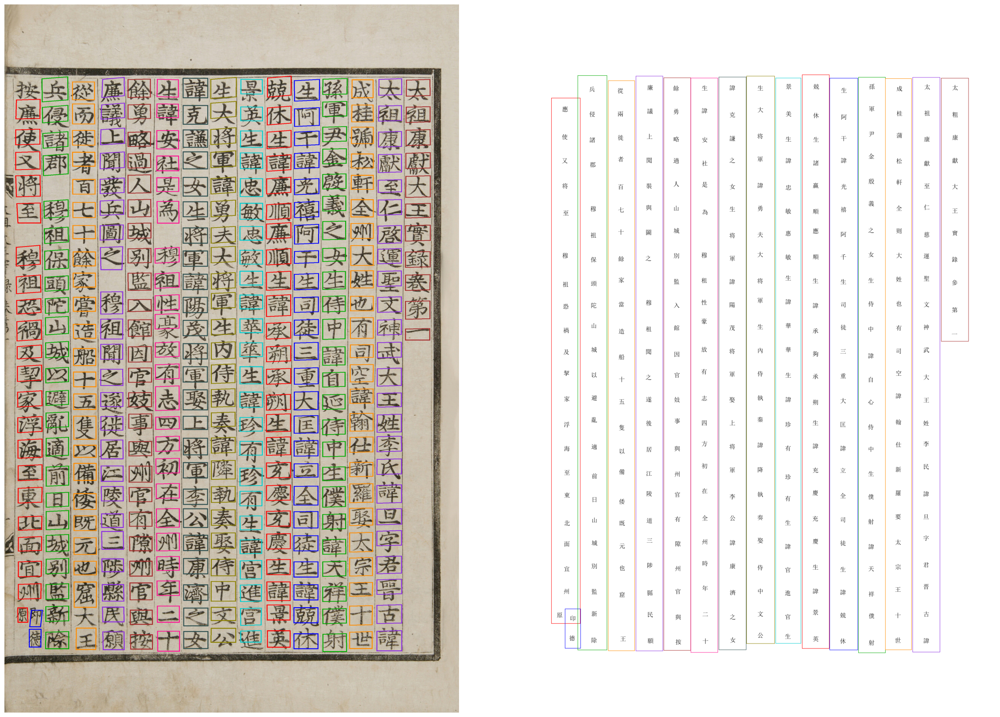

📊 분석 결과: 342개 단어, 16개 세로줄
✅ 분석 및 시각화 완료!
🎉 분석 성공!


In [2]:
"""
Azure Document Intelligence 역사문서 OCR 분석 도구 (개선 버전)
- 실시간 Azure API 호출 및 OCR 분석
- 한자/고문서 시각화
- 세로줄 기반 컬러 렌더링
"""

# Jupyter 환경 설정
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [24, 16]

import os
import json
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from typing import List, Dict, Optional
import platform
import warnings
from pathlib import Path
from datetime import datetime

# 환경변수 로드
try:
    from dotenv import load_dotenv
    load_dotenv()
    print("✅ .env 파일 로드 완료")
except ImportError:
    print("⚠️ python-dotenv 설치 필요: pip install python-dotenv")

# Azure SDK imports
try:
    from azure.core.credentials import AzureKeyCredential
    from azure.ai.documentintelligence import DocumentIntelligenceClient
    from azure.ai.documentintelligence.models import AnalyzeDocumentRequest
    AZURE_SDK_AVAILABLE = True
    print("✅ Azure SDK 로드 완료")
except ImportError:
    AZURE_SDK_AVAILABLE = False
    print("❌ Azure SDK 없음. 설치 필요: pip install azure-ai-documentintelligence")

warnings.filterwarnings('ignore')


class EnhancedAzureOCRAnalyzer:
    """개선된 Azure Document Intelligence OCR 분석기"""
    
    def __init__(self):
        print("🚀 Azure OCR 분석기 초기화...")
        
        # 더 진한 색상 정의 (구분하기 쉽게)
        self.colors = [
            '#FF0000',  # 빨강
            '#0000FF',  # 파랑  
            '#00AA00',  # 녹색
            '#FF8C00',  # 주황
            '#8A2BE2',  # 보라
            '#A52A2A',  # 갈색
            '#FF1493',  # 핑크
            '#2F4F4F',  # 회색
            '#8B8000',  # 올리브
            '#00CED1'   # 청록
        ]
        
        # RGB 색상 맵 (PIL용)
        self.color_map = {
            '#FF0000': (255, 0, 0),
            '#0000FF': (0, 0, 255), 
            '#00AA00': (0, 170, 0),
            '#FF8C00': (255, 140, 0),
            '#8A2BE2': (138, 43, 226),
            '#A52A2A': (165, 42, 42),
            '#FF1493': (255, 20, 147),
            '#2F4F4F': (47, 79, 79),
            '#8B8000': (139, 128, 0),
            '#00CED1': (0, 206, 209)
        }
        
        # Azure 클라이언트 설정
        self.document_client = self._setup_azure_client()
        
        # 폰트 설정
        self.han_font = self._setup_cjk_font()
        self._configure_matplotlib()
        
        print(f"✅ 초기화 완료")
    
    def _setup_azure_client(self):
        """Azure 클라이언트 설정"""
        if not AZURE_SDK_AVAILABLE:
            print("❌ Azure SDK 설치 필요: pip install azure-ai-documentintelligence")
            return None
        
        # 환경변수에서 로드
        endpoint = os.getenv('AZURE_INTELLIGENCE_ENDPOINT')
        key = os.getenv('AZURE_INTELLIGENCE_KEY')
        
        if not endpoint or not key:
            print("❌ Azure 환경변수가 설정되지 않았습니다.")
            return None
        
        try:
            client = DocumentIntelligenceClient(
                endpoint=endpoint,
                credential=AzureKeyCredential(key)
            )
            print("✅ Azure 클라이언트 연결 성공")
            return client
        except Exception as e:
            print(f"❌ Azure 클라이언트 연결 실패: {e}")
            return None
    
    def _setup_cjk_font(self):
        """한자 폰트 설정"""
        system = platform.system()
        
        if system == "Windows":
            font_paths = [
                "C:/Windows/Fonts/simsun.ttc",  # 한자 최적화
                "C:/Windows/Fonts/msyh.ttc",
                "C:/Windows/Fonts/batang.ttc"
            ]
            
            for font_path in font_paths:
                if os.path.exists(font_path):
                    try:
                        return fm.FontProperties(fname=font_path)
                    except:
                        continue
        
        return fm.FontProperties()
    
    def _configure_matplotlib(self):
        """matplotlib 설정"""
        plt.rcParams['font.family'] = ['sans-serif']
        plt.rcParams['axes.unicode_minus'] = False
        plt.rcParams['font.size'] = 14
    
    def analyze_image_realtime(self, image_path: str) -> Optional[Dict]:
        """실시간 Azure API로 이미지 분석"""
        if not self.document_client:
            print("❌ Azure 클라이언트가 설정되지 않았습니다.")
            return None
        
        if not os.path.exists(image_path):
            print(f"❌ 이미지 파일이 없습니다: {image_path}")
            return None
        
        try:
            print(f"📄 Azure로 실시간 분석 중: {os.path.basename(image_path)}")
            print("⏳ Azure API 호출 중... (30초-2분 소요)")
            
            # 이미지 파일 읽기
            with open(image_path, 'rb') as f:
                image_data = f.read()
            
            # Azure Document Intelligence API 실시간 호출
            poller = self.document_client.begin_analyze_document(
                "prebuilt-read",
                AnalyzeDocumentRequest(bytes_source=image_data)
            )
            
            # 결과 대기
            result = poller.result()
            
            # 결과를 표준 형태로 변환
            ocr_result = {
                "analyzeResult": {
                    "pages": [],
                    "version": "4.0",
                    "apiVersion": "2024-02-29-preview",
                    "modelId": "prebuilt-read"
                }
            }
            
            total_words = 0
            total_confidence = 0
            
            for page_idx, page in enumerate(result.pages):
                page_data = {
                    "pageNumber": page_idx + 1,
                    "words": []
                }
                
                if hasattr(page, 'words') and page.words:
                    for word in page.words:
                        word_data = {
                            "content": word.content,
                            "confidence": word.confidence if hasattr(word, 'confidence') else 0.9,
                            "polygon": list(word.polygon) if hasattr(word, 'polygon') else []
                        }
                        page_data["words"].append(word_data)
                        total_words += 1
                        total_confidence += word_data["confidence"]
                
                ocr_result["analyzeResult"]["pages"].append(page_data)
            
            # 분석 통계
            avg_confidence = total_confidence / total_words if total_words > 0 else 0
            print(f"✅ Azure 실시간 분석 완료: {total_words}개 단어, 평균 신뢰도 {avg_confidence:.3f}")
            
            return ocr_result
            
        except Exception as e:
            print(f"❌ Azure 실시간 분석 실패: {e}")
            return None
    
    def group_words_by_vertical_lines(self, words_data: List[Dict], threshold: float = 50) -> List[List[Dict]]:
        """세로줄로 그룹화 (한자 문서 특성 반영)"""
        if not words_data:
            return []
        
        # X 좌표 기준으로 정렬
        sorted_words = sorted(words_data, key=lambda w: w['polygon'][0])
        vertical_lines = []
        current_line = [sorted_words[0]]
        
        for word in sorted_words[1:]:
            current_line_avg_x = sum(w['polygon'][0] for w in current_line) / len(current_line)
            current_word_x = word['polygon'][0]
            
            if abs(current_word_x - current_line_avg_x) <= threshold:
                current_line.append(word)
            else:
                # Y 좌표로 정렬 (세로 읽기)
                current_line.sort(key=lambda w: w['polygon'][1])
                vertical_lines.append(current_line)
                current_line = [word]
        
        if current_line:
            current_line.sort(key=lambda w: w['polygon'][1])
            vertical_lines.append(current_line)
        
        return vertical_lines
    
    def create_visualization(self, image_path: str, ocr_data: Dict, save_path: Optional[str] = None):
        """OCR 결과 시각화"""
        print(f"🎨 시각화 생성: {os.path.basename(image_path)}")
        
        # 단어 데이터 추출
        words_data = []
        for page in ocr_data["analyzeResult"]["pages"]:
            words_data.extend(page["words"])
        
        if not words_data:
            print("❌ OCR 데이터가 비어있습니다.")
            return None
        
        # 세로줄 그룹화
        vertical_lines = self.group_words_by_vertical_lines(words_data)
        
        # 원본 이미지 로드
        try:
            original_image = Image.open(image_path)
            width, height = original_image.size
        except Exception as e:
            print(f"❌ 이미지 로드 실패: {e}")
            return None
        
        # 시각화 생성
        fig, axes = plt.subplots(1, 2, figsize=(24, 16))
        
        # 좌측: 진한 색상 박스 이미지
        boxed_image = self._create_colored_boxes(image_path, vertical_lines)
        axes[0].imshow(boxed_image)
        axes[0].axis('off')
        
        # 우측: 균일한 크기 한자 텍스트 + 세로 윤곽선
        text_image = self._create_text_rendering_with_outlines(image_path, vertical_lines, width, height)
        axes[1].imshow(text_image)
        axes[1].axis('off')
        
        # 여백 최소화
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.02)
        
        # 저장 또는 표시
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
            print(f"💾 시각화 저장: {save_path}")
        
        plt.show()
        
        # 간단한 통계만 출력
        print(f"📊 분석 결과: {len(words_data)}개 단어, {len(vertical_lines)}개 세로줄")
        
        return vertical_lines
    
    def _create_colored_boxes(self, image_path: str, vertical_lines: List[List[Dict]]) -> np.ndarray:
        """진한 색상 박스 이미지 생성"""
        try:
            pil_image = Image.open(image_path).convert('RGB')
            draw = ImageDraw.Draw(pil_image)
            
            for line_idx, line_words in enumerate(vertical_lines):
                color_hex = self.colors[line_idx % len(self.colors)]
                color_rgb = self.color_map[color_hex]
                
                for word in line_words:
                    polygon = word['polygon']
                    if len(polygon) >= 4:
                        points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                        # 더 두꺼운 테두리로 진하게
                        draw.polygon(points, outline=color_rgb, width=5)
            
            return np.array(pil_image)
            
        except Exception as e:
            print(f"❌ 색상 박스 생성 실패: {e}")
            return np.ones((300, 300, 3), dtype=np.uint8) * 255
    
    def _create_text_rendering_with_outlines(self, image_path: str, vertical_lines: List[List[Dict]], width: int, height: int) -> np.ndarray:
        """균일한 크기 한자 + 세로 윤곽선 렌더링"""
        try:
            # 흰색 배경 이미지 생성
            pil_image = Image.new('RGB', (width, height), 'white')
            draw = ImageDraw.Draw(pil_image)
            
            # 균일한 폰트 크기 설정 (고정값)
            UNIFORM_FONT_SIZE = 32  # 모든 글자에 동일한 크기 적용
            
            # 폰트 미리 로드
            try:
                if platform.system() == "Windows":
                    font_path = "C:/Windows/Fonts/simsun.ttc"
                    if os.path.exists(font_path):
                        uniform_font = ImageFont.truetype(font_path, UNIFORM_FONT_SIZE)
                    else:
                        uniform_font = ImageFont.load_default()
                else:
                    uniform_font = ImageFont.load_default()
            except:
                uniform_font = ImageFont.load_default()
            
            # 각 세로줄에 대해 윤곽선 그리기 + 균일한 크기 텍스트
            for line_idx, line_words in enumerate(vertical_lines):
                if not line_words:
                    continue
                    
                color_hex = self.colors[line_idx % len(self.colors)]
                color_rgb = self.color_map[color_hex]
                
                # 세로줄 영역 계산
                x_coords = []
                y_coords = []
                for word in line_words:
                    polygon = word['polygon']
                    if len(polygon) >= 4:
                        points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                        x_coords.extend([p[0] for p in points])
                        y_coords.extend([p[1] for p in points])
                
                if x_coords and y_coords:
                    min_x = min(x_coords) - 5
                    max_x = max(x_coords) + 5
                    min_y = min(y_coords) - 5
                    max_y = max(y_coords) + 5
                    
                    # 세로줄 윤곽선만 그리기 (내부 채우지 않음)
                    draw.rectangle(
                        [(min_x, min_y), (max_x, max_y)], 
                        outline=color_rgb, 
                        width=2
                    )
                
                # 균일한 크기 한자 텍스트 렌더링
                for word in line_words:
                    polygon = word['polygon']
                    if len(polygon) >= 4:
                        points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                        center_x = sum(p[0] for p in points) / len(points)
                        center_y = sum(p[1] for p in points) / len(points)
                        
                        # 진한 한자 텍스트 그리기 (균일한 크기)
                        draw.text(
                            (center_x, center_y), 
                            word['content'],
                            font=uniform_font,
                            fill='black',
                            anchor='mm'
                        )
            
            return np.array(pil_image)
            
        except Exception as e:
            print(f"❌ 텍스트 렌더링 실패: {e}")
            return np.ones((height, width, 3), dtype=np.uint8) * 255
    
    def analyze_complete(self, image_path: str) -> bool:
        """완전한 실시간 분석 및 시각화"""
        print(f"🚀 Azure 완전 분석 시작: {os.path.basename(image_path)}")
        
        # 1. Azure API로 실시간 분석
        ocr_data = self.analyze_image_realtime(image_path)
        
        if not ocr_data:
            print("❌ 실시간 분석 실패")
            return False
        
        # 2. 시각화 생성
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        viz_path = f"{Path(image_path).stem}_viz_{timestamp}.png"
        
        result = self.create_visualization(image_path, ocr_data, viz_path)
        
        if result:
            print("✅ 분석 및 시각화 완료!")
            return True
        else:
            print("❌ 시각화 실패")
            return False


# 실행 함수
def run_azure_analysis():
    """Azure OCR 분석 실행"""
    print("🚀 Azure Document Intelligence OCR")
    print("=" * 50)
    
    # 분석기 초기화
    analyzer = EnhancedAzureOCRAnalyzer()
    
    if not analyzer.document_client:
        print("❌ Azure 설정이 필요합니다.")
        return False
    
    # 분석할 이미지 경로
    image_path = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes-Hoyeon\data\raw\training\원천\태조실록_001권_총서_001a면.jpg"
    
    if os.path.exists(image_path):
        success = analyzer.analyze_complete(image_path)
        if success:
            print("🎉 분석 성공!")
        return success
    else:
        print("❌ 분석할 이미지 파일을 찾을 수 없습니다.")
        print(f"💡 경로 확인: {image_path}")
        return False

# 실행
if __name__ == "__main__":
    run_azure_analysis()

✅ .env 파일 로드 완료
✅ Azure SDK 로드 완료
🚀 Azure Document Intelligence OCR
🚀 Azure OCR 분석기 초기화...
✅ Azure 클라이언트 연결 성공
✅ 초기화 완료
🚀 Azure 완전 분석 시작: 태조실록_001권_총서_001a면.jpg
📄 Azure로 실시간 분석 중: 태조실록_001권_총서_001a면.jpg
⏳ Azure API 호출 중... (30초-2분 소요)
✅ Azure 실시간 분석 완료: 342개 단어, 평균 신뢰도 0.912
🎨 시각화 생성: 태조실록_001권_총서_001a면.jpg
💾 시각화 저장: 태조실록_001권_총서_001a면_viz_20250805_150329.png


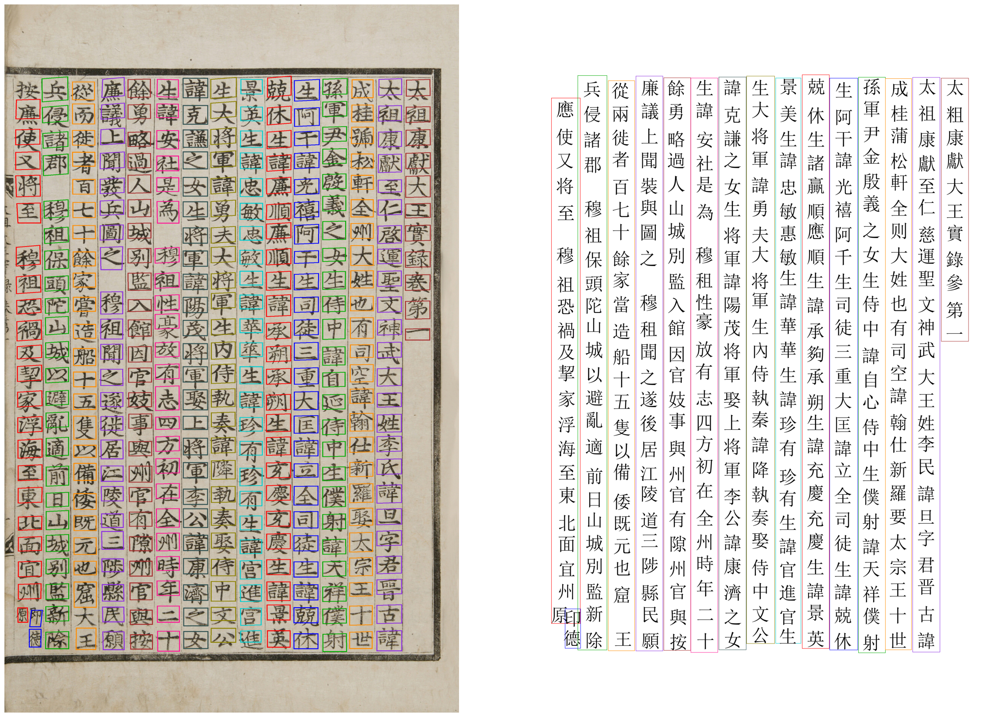

📊 분석 결과: 342개 단어, 16개 세로줄
✅ 분석 및 시각화 완료!
🎉 분석 성공!


In [4]:
"""
Azure Document Intelligence 역사문서 OCR 분석 도구 (개선 버전)
- 실시간 Azure API 호출 및 OCR 분석
- 한자/고문서 시각화
- 세로줄 기반 컬러 렌더링
"""

# Jupyter 환경 설정
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [24, 16]

import os
import json
import numpy as np
from PIL import Image, ImageDraw, ImageFont
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from typing import List, Dict, Optional
import platform
import warnings
from pathlib import Path
from datetime import datetime

# 환경변수 로드
try:
    from dotenv import load_dotenv
    load_dotenv()
    print("✅ .env 파일 로드 완료")
except ImportError:
    print("⚠️ python-dotenv 설치 필요: pip install python-dotenv")

# Azure SDK imports
try:
    from azure.core.credentials import AzureKeyCredential
    from azure.ai.documentintelligence import DocumentIntelligenceClient
    from azure.ai.documentintelligence.models import AnalyzeDocumentRequest
    AZURE_SDK_AVAILABLE = True
    print("✅ Azure SDK 로드 완료")
except ImportError:
    AZURE_SDK_AVAILABLE = False
    print("❌ Azure SDK 없음. 설치 필요: pip install azure-ai-documentintelligence")

warnings.filterwarnings('ignore')


class EnhancedAzureOCRAnalyzer:
    """개선된 Azure Document Intelligence OCR 분석기"""
    
    def __init__(self):
        print("🚀 Azure OCR 분석기 초기화...")
        
        # 더 진한 색상 정의 (구분하기 쉽게)
        self.colors = [
            '#FF0000',  # 빨강
            '#0000FF',  # 파랑  
            '#00AA00',  # 녹색
            '#FF8C00',  # 주황
            '#8A2BE2',  # 보라
            '#A52A2A',  # 갈색
            '#FF1493',  # 핑크
            '#2F4F4F',  # 회색
            '#8B8000',  # 올리브
            '#00CED1'   # 청록
        ]
        
        # RGB 색상 맵 (PIL용)
        self.color_map = {
            '#FF0000': (255, 0, 0),
            '#0000FF': (0, 0, 255), 
            '#00AA00': (0, 170, 0),
            '#FF8C00': (255, 140, 0),
            '#8A2BE2': (138, 43, 226),
            '#A52A2A': (165, 42, 42),
            '#FF1493': (255, 20, 147),
            '#2F4F4F': (47, 79, 79),
            '#8B8000': (139, 128, 0),
            '#00CED1': (0, 206, 209)
        }
        
        # Azure 클라이언트 설정
        self.document_client = self._setup_azure_client()
        
        # 폰트 설정
        self.han_font = self._setup_cjk_font()
        self._configure_matplotlib()
        
        print(f"✅ 초기화 완료")
    
    def _setup_azure_client(self):
        """Azure 클라이언트 설정"""
        if not AZURE_SDK_AVAILABLE:
            print("❌ Azure SDK 설치 필요: pip install azure-ai-documentintelligence")
            return None
        
        # 환경변수에서 로드
        endpoint = os.getenv('AZURE_INTELLIGENCE_ENDPOINT')
        key = os.getenv('AZURE_INTELLIGENCE_KEY')
        
        if not endpoint or not key:
            print("❌ Azure 환경변수가 설정되지 않았습니다.")
            return None
        
        try:
            client = DocumentIntelligenceClient(
                endpoint=endpoint,
                credential=AzureKeyCredential(key)
            )
            print("✅ Azure 클라이언트 연결 성공")
            return client
        except Exception as e:
            print(f"❌ Azure 클라이언트 연결 실패: {e}")
            return None
    
    def _setup_cjk_font(self):
        """한자 폰트 설정"""
        system = platform.system()
        
        if system == "Windows":
            font_paths = [
                "C:/Windows/Fonts/simsun.ttc",  # 한자 최적화
                "C:/Windows/Fonts/msyh.ttc",
                "C:/Windows/Fonts/batang.ttc"
            ]
            
            for font_path in font_paths:
                if os.path.exists(font_path):
                    try:
                        return fm.FontProperties(fname=font_path)
                    except:
                        continue
        
        return fm.FontProperties()
    
    def _configure_matplotlib(self):
        """matplotlib 설정"""
        plt.rcParams['font.family'] = ['sans-serif']
        plt.rcParams['axes.unicode_minus'] = False
        plt.rcParams['font.size'] = 14
    
    def analyze_image_realtime(self, image_path: str) -> Optional[Dict]:
        """실시간 Azure API로 이미지 분석"""
        if not self.document_client:
            print("❌ Azure 클라이언트가 설정되지 않았습니다.")
            return None
        
        if not os.path.exists(image_path):
            print(f"❌ 이미지 파일이 없습니다: {image_path}")
            return None
        
        try:
            print(f"📄 Azure로 실시간 분석 중: {os.path.basename(image_path)}")
            print("⏳ Azure API 호출 중... (30초-2분 소요)")
            
            # 이미지 파일 읽기
            with open(image_path, 'rb') as f:
                image_data = f.read()
            
            # Azure Document Intelligence API 실시간 호출
            poller = self.document_client.begin_analyze_document(
                "prebuilt-read",
                AnalyzeDocumentRequest(bytes_source=image_data)
            )
            
            # 결과 대기
            result = poller.result()
            
            # 결과를 표준 형태로 변환
            ocr_result = {
                "analyzeResult": {
                    "pages": [],
                    "version": "4.0",
                    "apiVersion": "2024-02-29-preview",
                    "modelId": "prebuilt-read"
                }
            }
            
            total_words = 0
            total_confidence = 0
            
            for page_idx, page in enumerate(result.pages):
                page_data = {
                    "pageNumber": page_idx + 1,
                    "words": []
                }
                
                if hasattr(page, 'words') and page.words:
                    for word in page.words:
                        word_data = {
                            "content": word.content,
                            "confidence": word.confidence if hasattr(word, 'confidence') else 0.9,
                            "polygon": list(word.polygon) if hasattr(word, 'polygon') else []
                        }
                        page_data["words"].append(word_data)
                        total_words += 1
                        total_confidence += word_data["confidence"]
                
                ocr_result["analyzeResult"]["pages"].append(page_data)
            
            # 분석 통계
            avg_confidence = total_confidence / total_words if total_words > 0 else 0
            print(f"✅ Azure 실시간 분석 완료: {total_words}개 단어, 평균 신뢰도 {avg_confidence:.3f}")
            
            return ocr_result
            
        except Exception as e:
            print(f"❌ Azure 실시간 분석 실패: {e}")
            return None
    
    def group_words_by_vertical_lines(self, words_data: List[Dict], threshold: float = 50) -> List[List[Dict]]:
        """세로줄로 그룹화 (한자 문서 특성 반영)"""
        if not words_data:
            return []
        
        # X 좌표 기준으로 정렬
        sorted_words = sorted(words_data, key=lambda w: w['polygon'][0])
        vertical_lines = []
        current_line = [sorted_words[0]]
        
        for word in sorted_words[1:]:
            current_line_avg_x = sum(w['polygon'][0] for w in current_line) / len(current_line)
            current_word_x = word['polygon'][0]
            
            if abs(current_word_x - current_line_avg_x) <= threshold:
                current_line.append(word)
            else:
                # Y 좌표로 정렬 (세로 읽기)
                current_line.sort(key=lambda w: w['polygon'][1])
                vertical_lines.append(current_line)
                current_line = [word]
        
        if current_line:
            current_line.sort(key=lambda w: w['polygon'][1])
            vertical_lines.append(current_line)
        
        return vertical_lines
    
    def create_visualization(self, image_path: str, ocr_data: Dict, save_path: Optional[str] = None):
        """OCR 결과 시각화"""
        print(f"🎨 시각화 생성: {os.path.basename(image_path)}")
        
        # 단어 데이터 추출
        words_data = []
        for page in ocr_data["analyzeResult"]["pages"]:
            words_data.extend(page["words"])
        
        if not words_data:
            print("❌ OCR 데이터가 비어있습니다.")
            return None
        
        # 세로줄 그룹화
        vertical_lines = self.group_words_by_vertical_lines(words_data)
        
        # 원본 이미지 로드
        try:
            original_image = Image.open(image_path)
            width, height = original_image.size
        except Exception as e:
            print(f"❌ 이미지 로드 실패: {e}")
            return None
        
        # 시각화 생성
        fig, axes = plt.subplots(1, 2, figsize=(24, 16))
        
        # 좌측: 진한 색상 박스 이미지
        boxed_image = self._create_colored_boxes(image_path, vertical_lines)
        axes[0].imshow(boxed_image)
        axes[0].axis('off')
        
        # 우측: 균일한 크기 한자 텍스트 + 세로 윤곽선
        text_image = self._create_text_rendering_with_outlines(image_path, vertical_lines, width, height)
        axes[1].imshow(text_image)
        axes[1].axis('off')
        
        # 여백 최소화
        plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.02)
        
        # 저장 또는 표시
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
            print(f"💾 시각화 저장: {save_path}")
        
        plt.show()
        
        # 간단한 통계만 출력
        print(f"📊 분석 결과: {len(words_data)}개 단어, {len(vertical_lines)}개 세로줄")
        
        return vertical_lines
    
    def _create_colored_boxes(self, image_path: str, vertical_lines: List[List[Dict]]) -> np.ndarray:
        """진한 색상 박스 이미지 생성"""
        try:
            pil_image = Image.open(image_path).convert('RGB')
            draw = ImageDraw.Draw(pil_image)
            
            for line_idx, line_words in enumerate(vertical_lines):
                color_hex = self.colors[line_idx % len(self.colors)]
                color_rgb = self.color_map[color_hex]
                
                for word in line_words:
                    polygon = word['polygon']
                    if len(polygon) >= 4:
                        points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                        # 더 두꺼운 테두리로 진하게
                        draw.polygon(points, outline=color_rgb, width=5)
            
            return np.array(pil_image)
            
        except Exception as e:
            print(f"❌ 색상 박스 생성 실패: {e}")
            return np.ones((300, 300, 3), dtype=np.uint8) * 255
    
    def _create_text_rendering_with_outlines(self, image_path: str, vertical_lines: List[List[Dict]], width: int, height: int) -> np.ndarray:
        """균일한 크기 한자 + 세로 윤곽선 렌더링"""
        try:
            # 흰색 배경 이미지 생성
            pil_image = Image.new('RGB', (width, height), 'white')
            draw = ImageDraw.Draw(pil_image)
            
            # 균일한 폰트 크기 설정 (고정값)
            UNIFORM_FONT_SIZE = 96  # 모든 글자에 동일한 크기 적용
            
            # 폰트 미리 로드
            try:
                if platform.system() == "Windows":
                    font_path = "C:/Windows/Fonts/simsun.ttc"
                    if os.path.exists(font_path):
                        uniform_font = ImageFont.truetype(font_path, UNIFORM_FONT_SIZE)
                    else:
                        uniform_font = ImageFont.load_default()
                else:
                    uniform_font = ImageFont.load_default()
            except:
                uniform_font = ImageFont.load_default()
            
            # 각 세로줄에 대해 윤곽선 그리기 + 균일한 크기 텍스트
            for line_idx, line_words in enumerate(vertical_lines):
                if not line_words:
                    continue
                    
                color_hex = self.colors[line_idx % len(self.colors)]
                color_rgb = self.color_map[color_hex]
                
                # 세로줄 영역 계산
                x_coords = []
                y_coords = []
                for word in line_words:
                    polygon = word['polygon']
                    if len(polygon) >= 4:
                        points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                        x_coords.extend([p[0] for p in points])
                        y_coords.extend([p[1] for p in points])
                
                if x_coords and y_coords:
                    min_x = min(x_coords) - 5
                    max_x = max(x_coords) + 5
                    min_y = min(y_coords) - 5
                    max_y = max(y_coords) + 5
                    
                    # 세로줄 윤곽선만 그리기 (내부 채우지 않음)
                    draw.rectangle(
                        [(min_x, min_y), (max_x, max_y)], 
                        outline=color_rgb, 
                        width=2
                    )
                
                # 균일한 크기 한자 텍스트 렌더링
                for word in line_words:
                    polygon = word['polygon']
                    if len(polygon) >= 4:
                        points = [(polygon[i], polygon[i+1]) for i in range(0, len(polygon), 2)]
                        center_x = sum(p[0] for p in points) / len(points)
                        center_y = sum(p[1] for p in points) / len(points)
                        
                        # 진한 한자 텍스트 그리기 (균일한 크기)
                        draw.text(
                            (center_x, center_y), 
                            word['content'],
                            font=uniform_font,
                            fill='black',
                            anchor='mm'
                        )
            
            return np.array(pil_image)
            
        except Exception as e:
            print(f"❌ 텍스트 렌더링 실패: {e}")
            return np.ones((height, width, 3), dtype=np.uint8) * 255
    
    def analyze_complete(self, image_path: str) -> bool:
        """완전한 실시간 분석 및 시각화"""
        print(f"🚀 Azure 완전 분석 시작: {os.path.basename(image_path)}")
        
        # 1. Azure API로 실시간 분석
        ocr_data = self.analyze_image_realtime(image_path)
        
        if not ocr_data:
            print("❌ 실시간 분석 실패")
            return False
        
        # 2. 시각화 생성
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        viz_path = f"{Path(image_path).stem}_viz_{timestamp}.png"
        
        result = self.create_visualization(image_path, ocr_data, viz_path)
        
        if result:
            print("✅ 분석 및 시각화 완료!")
            return True
        else:
            print("❌ 시각화 실패")
            return False


# 실행 함수
def run_azure_analysis():
    """Azure OCR 분석 실행"""
    print("🚀 Azure Document Intelligence OCR")
    print("=" * 50)
    
    # 분석기 초기화
    analyzer = EnhancedAzureOCRAnalyzer()
    
    if not analyzer.document_client:
        print("❌ Azure 설정이 필요합니다.")
        return False
    
    # 분석할 이미지 경로
    image_path = r"C:\Users\EL76\OneDrive\Desktop\IT\Project\5eyes-Hoyeon\data\raw\training\원천\태조실록_001권_총서_001a면.jpg"
    
    if os.path.exists(image_path):
        success = analyzer.analyze_complete(image_path)
        if success:
            print("🎉 분석 성공!")
        return success
    else:
        print("❌ 분석할 이미지 파일을 찾을 수 없습니다.")
        print(f"💡 경로 확인: {image_path}")
        return False

# 실행
if __name__ == "__main__":
    run_azure_analysis()